In [43]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import geopandas as gpd
%matplotlib inline

In [44]:
gdf = gpd.GeoDataFrame.from_file('Data/NYClisting.geojson')
gdf.head()
df = gdf[['latitude','longitude']]
coords = gdf.as_matrix(columns=['latitude','longitude'])

In [52]:
kms_per_radian = 6371.0088
epsilon = 0.1 / kms_per_radian
db = DBSCAN(eps=epsilon, min_samples=1, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords[cluster_labels == n] for n in range(num_clusters)])
print('Number of clusters: {}'.format(num_clusters))

Number of clusters: 2941


In [53]:
set(db.labels_)

{0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [54]:
def get_centermost_point(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    centermost_point = min(cluster, key=lambda point: great_circle(point, centroid).m)
    return tuple(centermost_point)
centermost_points = clusters.map(get_centermost_point)

In [55]:
lats, lons = zip(*centermost_points)
rep_points = pd.DataFrame({'long':lons, 'lat':lats})

In [56]:
rep_points.head()

,lat,long
0,40.844870,-73.789541
1,40.839396,-73.781437
2,40.855898,-73.789496
3,40.849775,-73.786609
4,40.852054,-73.788680


In [57]:
rs = rep_points.apply(lambda row: df[(df['latitude']==row['lat']) & (df['longitude']==row['long'])].iloc[0], axis=1)
rs.head()

,latitude,longitude
0,40.844870,-73.789541
1,40.839396,-73.781437
2,40.855898,-73.789496
3,40.849775,-73.786609
4,40.852054,-73.788680


In [58]:
fname = 'Data/CensusTracks.geojson'
tracks = gpd.GeoDataFrame.from_file(fname)
print tracks.crs

{}


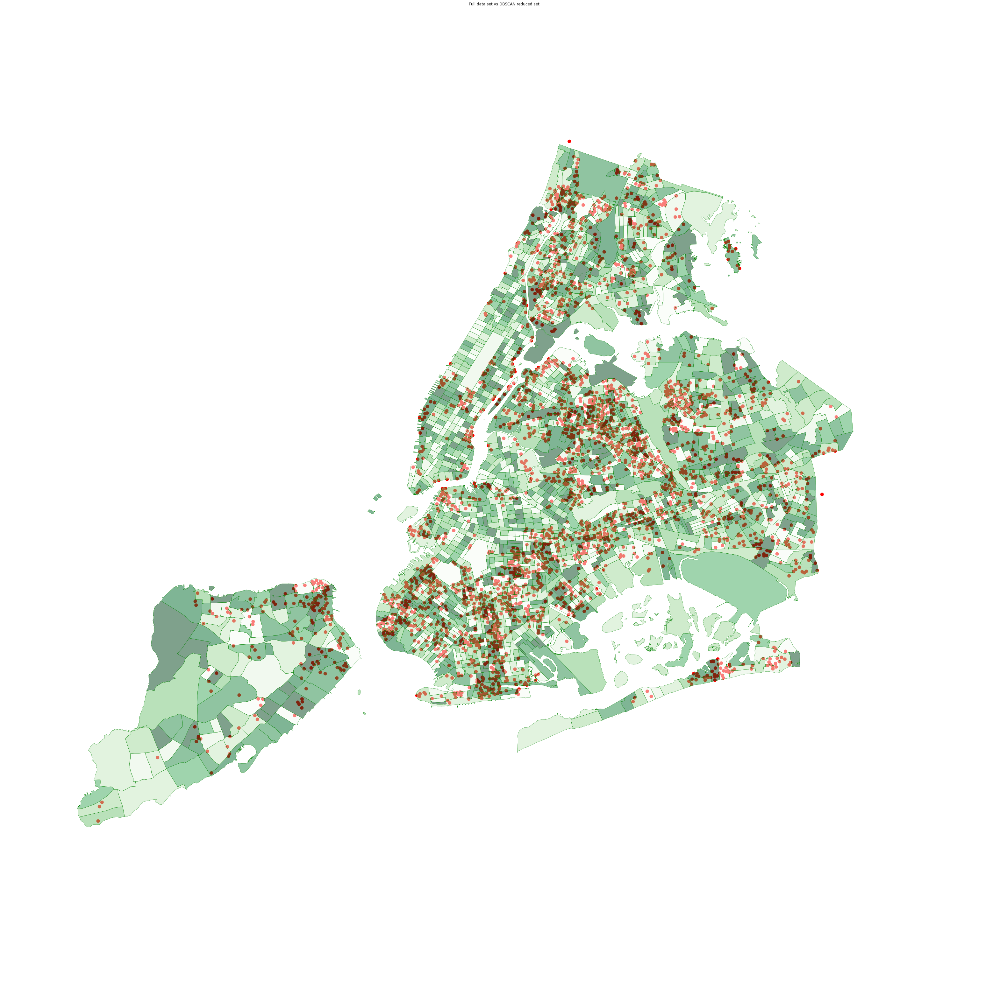

In [59]:
f, ax = plt.subplots(figsize=(55,55))
plt.axis('off')
tracks.plot(c = 'green', linewidth = .5, ax = ax,  cmap = 'Greens')
rs_scatter = ax.scatter(rs['longitude'], rs['latitude'], c='r', edgecolor='None', alpha=1, s=120)
#df_scatter = ax.scatter(df['long'], df['lat'], c='k', alpha=0.9, s=3)
ax.set_title('Full data set vs DBSCAN reduced set')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
#ax.legend([rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
plt.show()


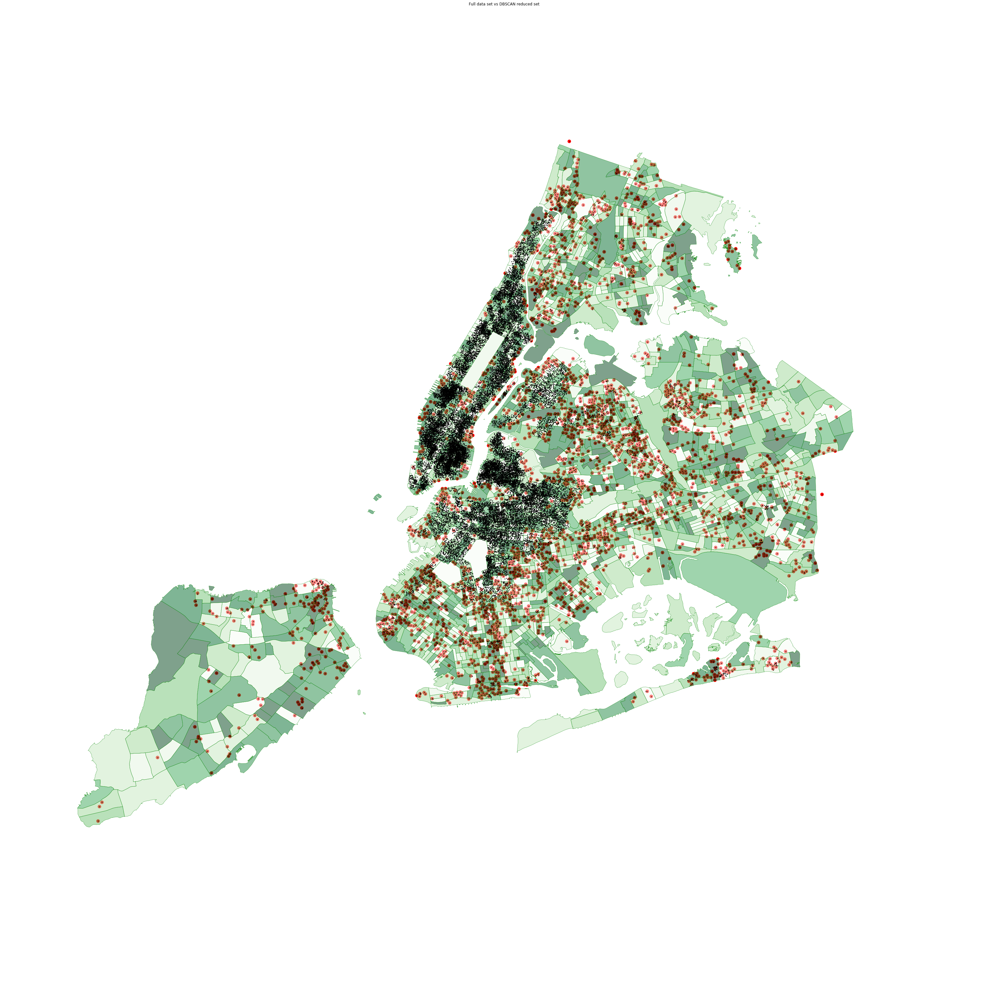

In [60]:
f, ax = plt.subplots(figsize=(55,55))
plt.axis('off')
tracks.plot(c = 'green', linewidth = .5, ax = ax,  cmap = 'Greens')
rs_scatter = ax.scatter(rs['longitude'], rs['latitude'], c='r', edgecolor='None', alpha=1, s=120)
gdf.plot(c = 'k', linewidth = .5, ax = ax)
#df_scatter = ax.scatter(df['longitude'], df['latitude'], c='k', alpha=0.9, s=3)
ax.set_title('Full data set vs DBSCAN reduced set')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
#ax.legend([rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
plt.show()

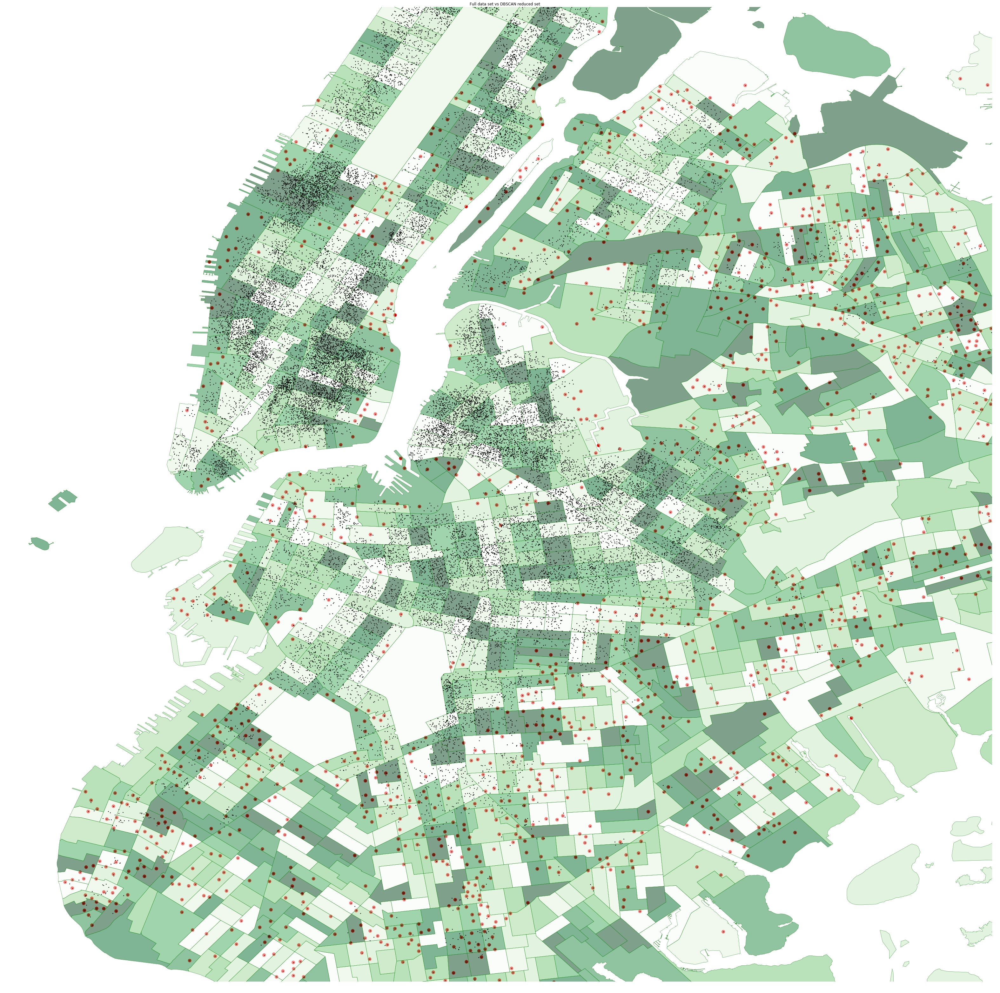

In [61]:
f, ax = plt.subplots(figsize=(55,55))
plt.axis('off')
plt.ylim(40.6, 40.8)
plt.xlim(-74.05, -73.85)
tracks.plot(c = 'green', linewidth = .5, ax = ax,  cmap = 'Greens')
rs_scatter = ax.scatter(rs['longitude'], rs['latitude'], c='r', edgecolor='None', alpha=1, s=120)
gdf.plot(c = 'k', linewidth = .5, ax = ax)
#df_scatter = ax.scatter(df['longitude'], df['latitude'], c='k', alpha=0.9, s=3)
ax.set_title('Full data set vs DBSCAN reduced set')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
#ax.legend([rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
plt.show()

In [65]:
import seaborn as sns

In [72]:
gdf.head(2)

,accesstosubway,availability_365,boro_ct_2010,calculated_host_listings_count,geometry,host_id,host_name,id,last_review,latitude,longitude,minimum_nights,name,neighbourhood,neighbourhood_group,number_of_reviews,price,reviews_per_month,room_type
0,11.946361,156,2051600,1,POINT (-73.78954050381778 40.8448695719099),403032,Diane,9147025,2017-03-02,40.844870,-73.789541,2,Cozy City Island Cottage,City Island,Bronx,36,125,2.49,Entire home/apt
1,12.035697,362,2051600,1,POINT (-73.78143724844766 40.83939619387105),20433973,Julia,3943387,2016-10-22,40.839396,-73.781437,1,Cozy City Island Room/Private Bath,City Island,Bronx,21,65,0.75,Private room


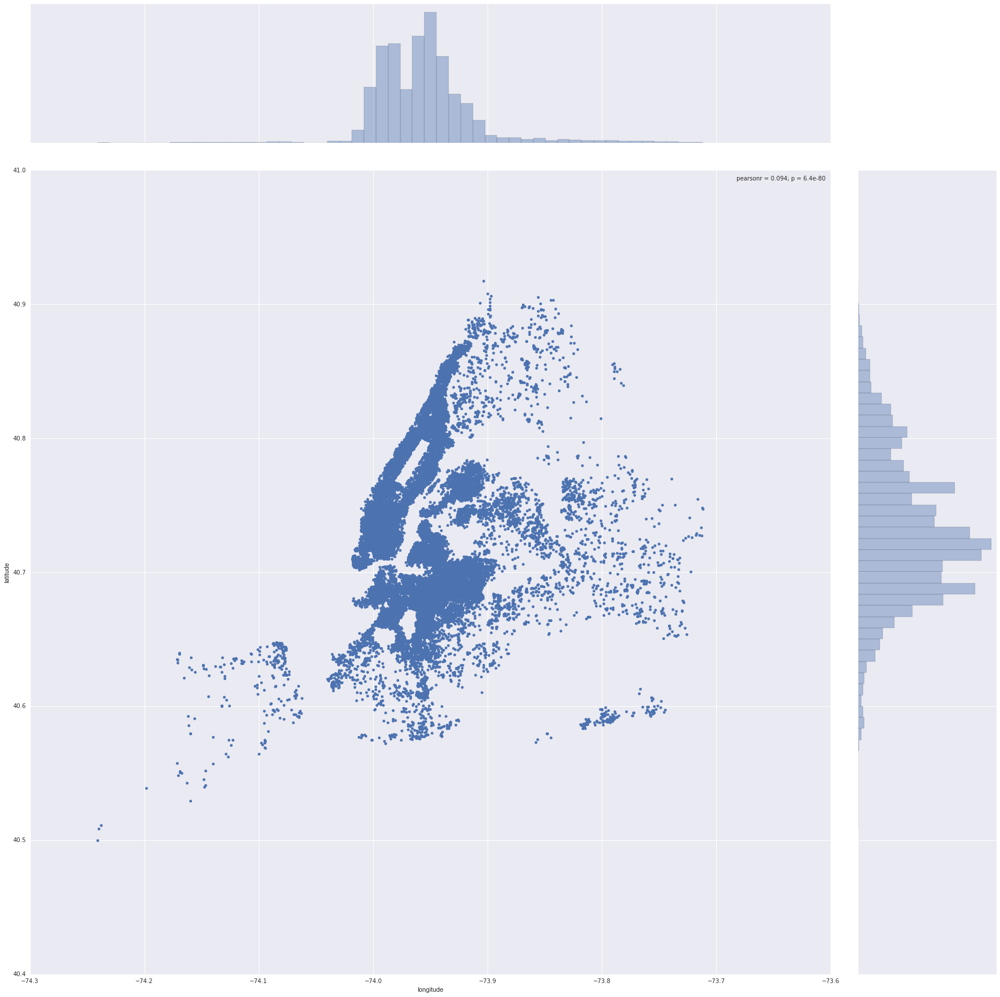

In [82]:
sns.jointplot(x="longitude", y="latitude", data=gdf,size=24)


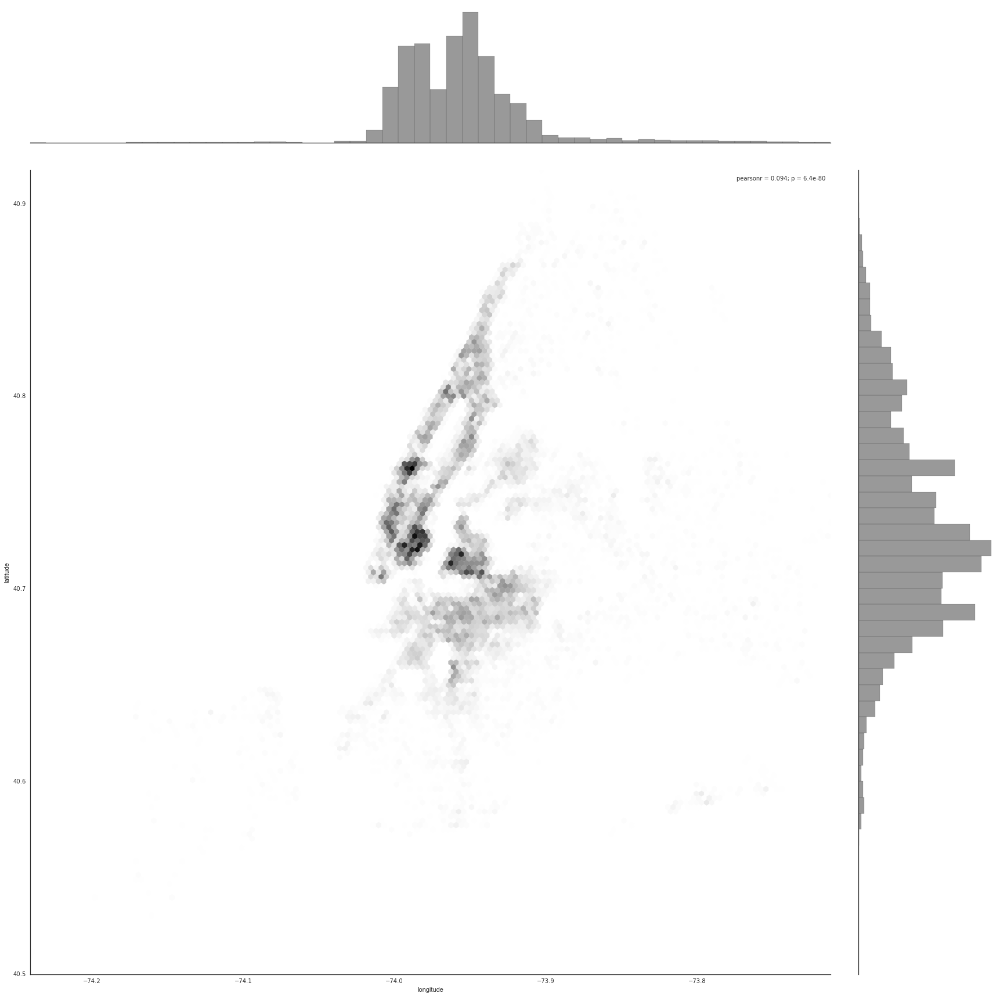

In [83]:
with sns.axes_style("white"):
    sns.jointplot(x="longitude", y="latitude", data=gdf,kind="hex", color="k", size=24)

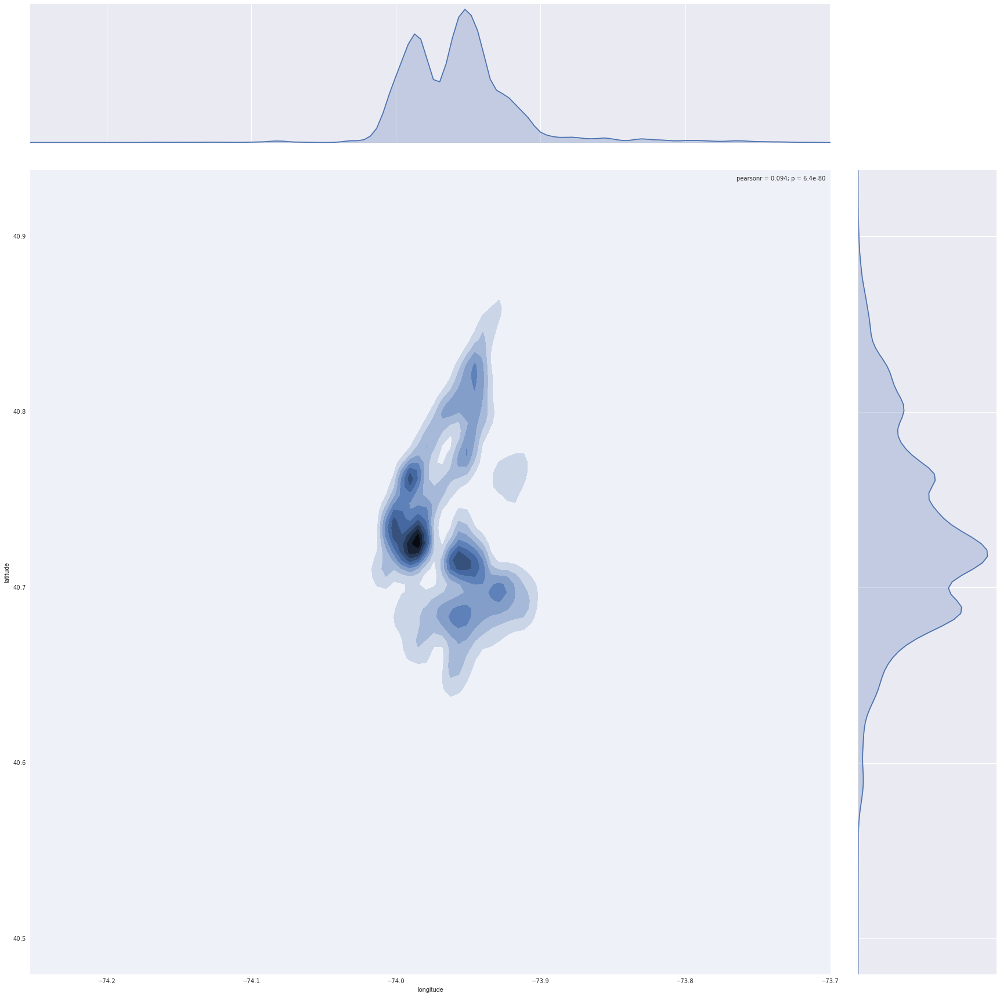

In [84]:
sns.jointplot(x="longitude", y="latitude", data=gdf, kind="kde", size=24);